<a href="https://colab.research.google.com/github/HiddenMistt/EDA-using-SQL-and-Python/blob/main/EDA_using_Python_Pandas_and_SQL.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [4]:
!pip install pandasql

  Created wheel for pandasql: filename=pandasql-0.7.3-py3-none-any.whl size=26781 sha256=d73d4ea8c701e03dfd7dfa05eaa21041b113e9475be9f0896d09382d4d68e8b4
  Stored in directory: /root/.cache/pip/wheels/5c/4b/ec/41f4e116c8053c3654e2c2a47c62b4fca34cc67ef7b55deb7f
Successfully built pandasql


In [8]:
##Importing Libraries

#For Linear Algebra
import numpy as np

#For Data Processing
import pandas as pd

#For Statistic Graphs
import seaborn as sns 

#Plots
import matplotlib.pyplot as plt

#SQL
import pandasql as ps 

#For Word Cloud plot
import wordcloud 

#For Filtering out the stop words
from wordcloud import WordCloud, STOPWORDS

In [9]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [12]:
cd /content/drive/MyDrive/Colab Notebooks/EDA using Python Pandas and SQL


/content/drive/MyDrive/Colab Notebooks/EDA using Python Pandas and SQL


In [13]:
df = pd.read_csv('r_dataisbeautiful_posts.csv')
df.head()

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (5,7) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,id,title,score,author,author_flair_text,removed_by,total_awards_received,awarders,created_utc,full_link,num_comments,over_18
0,ll1p9h,Wordcloud of trending video titles on YouTube ...,1,OmarZiada,OC: 1,NaN,0.0,[],1613473961,https://www.reddit.com/r/dataisbeautiful/comme...,0,False
1,ll1o4h,Wordcloud of trending videos on YouTube in the...,1,OmarZiada,OC: 1,moderator,0.0,[],1613473829,https://www.reddit.com/r/dataisbeautiful/comme...,1,False
2,ll15gx,Immunization in India. Source: https://niti.go...,1,Professional_Napper_,NaN,moderator,0.0,[],1613471541,https://www.reddit.com/r/dataisbeautiful/comme...,1,False
3,ll0iup,How to quickly estimate the impact of players ...,1,Viziball,NaN,automod_filtered,0.0,[],1613468624,https://www.reddit.com/r/dataisbeautiful/comme...,0,False
4,ll0g9a,How to quickly estimate the impact of players ...,1,Viziball,NaN,moderator,0.0,[],1613468281,https://www.reddit.com/r/dataisbeautiful/comme...,2,False


In [14]:
df.tail()

,id,title,score,author,author_flair_text,removed_by,total_awards_received,awarders,created_utc,full_link,num_comments,over_18
190848,pqbdl,Infosthetics seems like it belongs here.,15,magiclamp,NaN,NaN,NaN,NaN,1329282849,https://www.reddit.com/r/dataisbeautiful/comme...,0,False
190849,pqav2,Time lapse of every nuclear detonation from 19...,9,th3sousa,NaN,NaN,NaN,NaN,1329282160,https://www.reddit.com/r/dataisbeautiful/comme...,0,False
190850,pq922,Wavii.,13,ddshroom,NaN,NaN,NaN,NaN,1329279777,https://www.reddit.com/r/dataisbeautiful/comme...,2,False
190851,ppx09,An interactive representation of Pres. Obamas ...,21,zanycaswell,NaN,NaN,NaN,NaN,1329265203,https://www.reddit.com/r/dataisbeautiful/comme...,0,False
190852,ppvl7,A map showing the geographical distribution of...,45,zanycaswell,NaN,NaN,NaN,NaN,1329263456,https://www.reddit.com/r/dataisbeautiful/comme...,5,False


In [15]:
print("Data shape :",df.shape)

Data shape : (190853, 12)


#BASIC EDA

In [16]:
df.info()
print('-'*100)
df.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 190853 entries, 0 to 190852
Data columns (total 12 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   id                     190853 non-null  object 
 1   title                  190852 non-null  object 
 2   score                  190853 non-null  int64  
 3   author                 190853 non-null  object 
 4   author_flair_text      28845 non-null   object 
 5   removed_by             20744 non-null   object 
 6   total_awards_received  65146 non-null   float64
 7   awarders               54478 non-null   object 
 8   created_utc            190853 non-null  int64  
 9   full_link              190853 non-null  object 
 10  num_comments           190853 non-null  int64  
 11  over_18                190853 non-null  bool   
dtypes: bool(1), float64(1), int64(3), object(7)
memory usage: 16.2+ MB
---------------------------------------------------------------------------

,score,total_awards_received,created_utc,num_comments
count,190853.000000,65146.000000,1.908530e+05,190853.000000
mean,176.016159,0.013109,1.512494e+09,27.604732
std,1951.936524,0.589425,6.822624e+07,213.236378
min,0.000000,0.000000,1.329263e+09,0.000000
25%,1.000000,0.000000,1.463862e+09,1.000000
50%,1.000000,0.000000,1.518662e+09,2.000000
75%,4.000000,0.000000,1.576576e+09,5.000000
max,116226.000000,93.000000,1.613474e+09,18801.000000


In [17]:
#Empty values:
df.isnull().sum().sort_values(ascending = False)

removed_by               170109
author_flair_text        162008
awarders                 136375
total_awards_received    125707
title                         1
over_18                       0
num_comments                  0
full_link                     0
created_utc                   0
author                        0
score                         0
id                            0
dtype: int64

In [19]:
##Running SQL in Pandas


q1 = """SELECT removed_by, count(distinct id)as number_of_removed_posts
FROM df 
where removed_by is not null 
group by removed_by 
order by 2 desc """
grouped_df = ps.sqldf(q1, locals())
grouped_df

,removed_by,number_of_removed_posts
0,moderator,14789
1,deleted,2948
2,automod_filtered,1553
3,reddit,1453
4,author,1


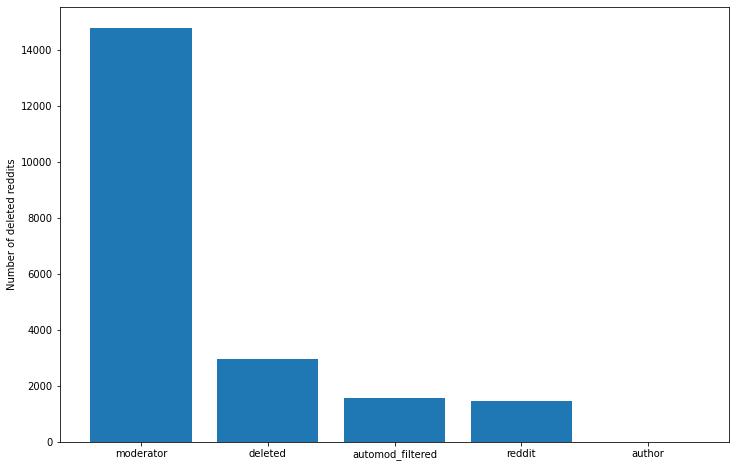

In [20]:
##Visualizing bar chart based of SQL output:

removed_by = grouped_df['removed_by'].tolist()
number_of_removed_posts = grouped_df['number_of_removed_posts'].tolist()

plt.figure(figsize=(12,8))
plt.ylabel("Number of deleted reddits")
plt.bar(removed_by, number_of_removed_posts)
plt.show()

This means that the majority of deleted posts (68%) were removed by a moderator, as can be seen. Authors remove less than 1% of the content.

Now lets see, Who are the top three users whose posts have been removed the most by moderators?

In [21]:
q2 = """SELECT author, count(id) as number_of_removed_posts 
FROM df 
where removed_by = 'moderator' 
group by author 
order by 2 desc 
limit 3"""

print(ps.sqldf(q2, locals()))


           author  number_of_removed_posts
0    hornedviper9                       71
1  peter_mladenov                       35
2   Ashrafkamarad                       20


In [22]:
## This means that hornedvsiper9 is not a good author because of high number of posts removed by moderators

Problem: Let’s see how many posts with the keyword “virus” are removed by the moderator.

In [23]:
## This will be done in steps

#Step 1: Getting proportion of all removed posts / removed "virus" posts

q3 = """
with Virus as (
SELECT id 
FROM df 
where removed_by = 'moderator' 
and title like '%virus%'
)
SELECT count(v.id) as virus_removed, count(d.id) as all_removed
FROM df d 
left join virus v on v.id = d.id 
where d.removed_by = 'moderator';"""

removed_moderator_df = ps.sqldf(q3, locals())
#print(type(removed_moderator_df))
print(removed_moderator_df.values)
print(removed_moderator_df.values[0])

[[ 1056 14789]]
[ 1056 14789]


In [24]:
#Step 2: getting % virus reddits from all removed posts:
virus_removed_id = removed_moderator_df.values[0][0]
all_removed_id = removed_moderator_df.values[0][1]
print(virus_removed_id/all_removed_id)

0.07140442220569342


In [25]:
## => The keyword “virus” appears in 7 percent of all posts removed by moderators.

Top 10 reddits with the most number of comments:

In [26]:
q4 = """SELECT title, num_comments as number_of_comments 
FROM df  
where title != 'data_irl'
order by 2 desc 
limit 10"""

print(ps.sqldf(q4, locals()))

                                               title  number_of_comments
0  The best (&amp; worst) countries for raising a...               12508
1            Police killing rates in G7 members [OC]               10425
2  [oc] How taboo and popular are sexual fetishes...               10396
3  Worst Episode Ever? The Most Commonly Rated Sh...                9217
4  The environmental impact of Beyond Meat and a ...                9120
5               What's getting cut in Trump's budget                8768
6      [OC] Mississippi, the Poorest State in the US                8703
7  [OC] Trump voters are less likely to have a co...                8354
8  [OC] Trending Google Searches by State Between...                8270
9  Almost all men are stronger than almost all wo...                7538


The most frequently used words in the Tiles

In [27]:
#To build a wordcloud, we have to remove NULL values first:

df["title"] = df["title"].fillna(value="")

In [28]:
#Let's add a string value instead to make our Series clean:

word_string=" ".join(df['title'].str.lower())
word_string

'wordcloud of trending video titles on youtube in the united states over 2017-2018 [oc] wordcloud of trending videos on youtube in the united states over 2017- 2018 immunization in india. source: https://niti.gov.in/content/immunisation how to quickly estimate the impact of players during a basketball game? [oc] how to quickly estimate the impact of players during a basketball game ? phpstorm 2020.3.3 crack full activation code latest version free 3dmark 2.17.7137 crack + serial key 2021 for [mac/win] update davinci resolve studio 17.0 cracked patch license key [2021] auslogics file recovery 10 crack + license key (2021) update [oc] timeline of the rise and fall of $gme (stock price info from yahoo finance and events from abcnews) [oc] solar installer comparison - san diego parliamentary election results in kosovo (2010-2021) [oc] us presidential candidates who got at least 1% of the popular vote (since 1964) i follow a twitter account that explores fake accounts/spam/etc. they post im

(-0.5, 1599.5, 799.5, -0.5)

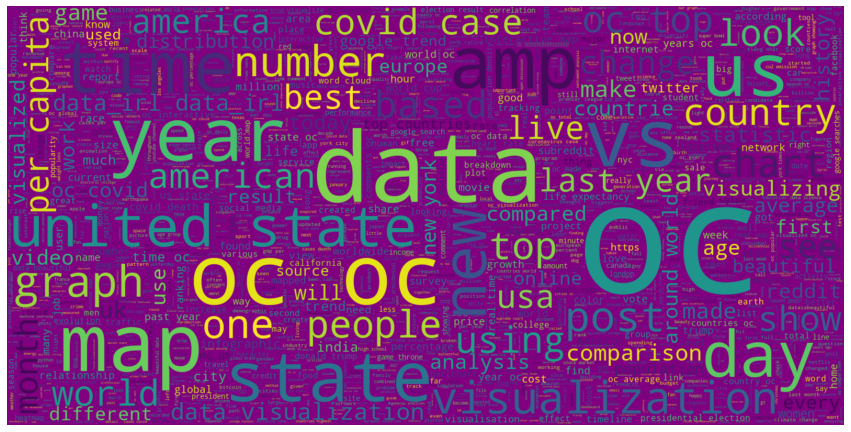

In [29]:
#Plotting:

plt.figure(figsize=(15,15))

wc = WordCloud(background_color="purple", stopwords = STOPWORDS, max_words=2000, max_font_size= 300,  width=1600, height=800)
wc.generate(word_string)

plt.imshow(wc.recolor( colormap= 'viridis' , random_state=17), interpolation="bilinear")
plt.axis('off')

Comments distribution Plot

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


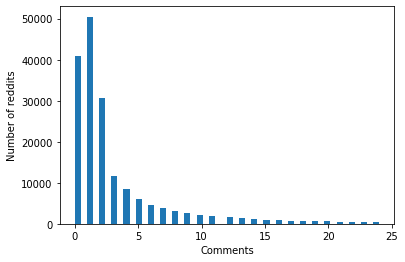

In [30]:
fig, ax = plt.subplots()
_ = sns.distplot(df[df["num_comments"] < 25]["num_comments"], kde=False, rug=False, hist_kws={'alpha': 1}, ax=ax)
_ = ax.set(xlabel="num_comments", ylabel="id")
plt.ylabel("Number of reddits")
plt.xlabel("Comments")
plt.show()

We can observe that most have less than 5 comments

#Correlation between dataset variables

In [31]:
df.corr()

,score,total_awards_received,created_utc,num_comments,over_18
score,1.000000,0.330506,0.005262,0.574893,0.015676
total_awards_received,0.330506,1.000000,0.027446,0.168387,0.001456
created_utc,0.005262,0.027446,1.000000,0.029795,0.014476
num_comments,0.574893,0.168387,0.029795,1.000000,0.022924
over_18,0.015676,0.001456,0.014476,0.022924,1.000000


With a correlation value of 0.6, we can see that score and number of comments are highly positively correlated.
There is a 0.2 correlation between total awards received, score (0.2), and the number of comments (num comments) (0.1)

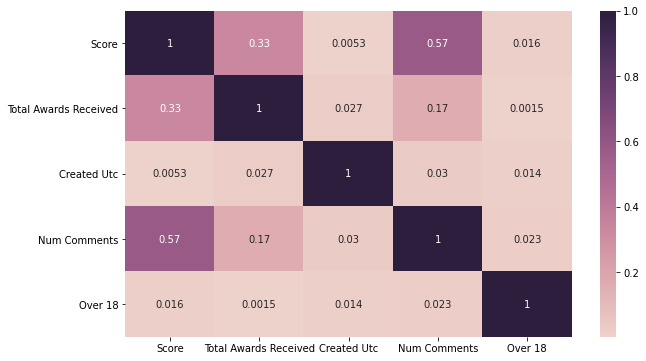

In [32]:
# Creating a heatmap to visiualize the above

h_labels = [x.replace('_', ' ').title() for x in 
            list(df.select_dtypes(include=['number', 'bool']).columns.values)]
fig, ax = plt.subplots(figsize=(10,6))
_ = sns.heatmap(df.corr(), annot=True, xticklabels=h_labels, yticklabels=h_labels, cmap=sns.cubehelix_palette(as_cmap=True), ax=ax)

Score Distribution

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


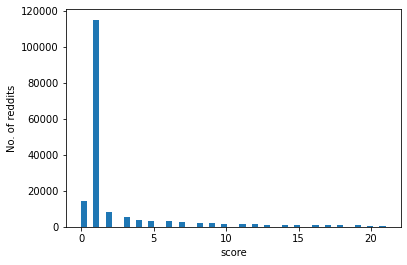

In [33]:
#Score distribution: 
fig, ax = plt.subplots()
_ = sns.distplot(df[df["score"] < 22]["score"], kde=False, hist_kws={'alpha': 1}, ax=ax)
_ = ax.set(xlabel="score", ylabel="No. of reddits")